# Read and show image

Original:


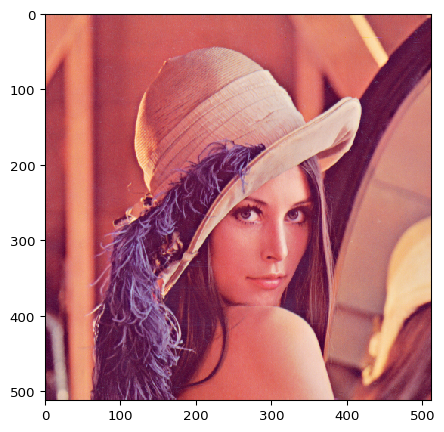

In [2]:
import imageio
import imgaug as ia
%matplotlib inline

image = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")

print("Original:")
ia.imshow(image)

# Affine rotate
**params**
- rotate : 旋转角度为 -25 到 25 的随机值

Augmented:


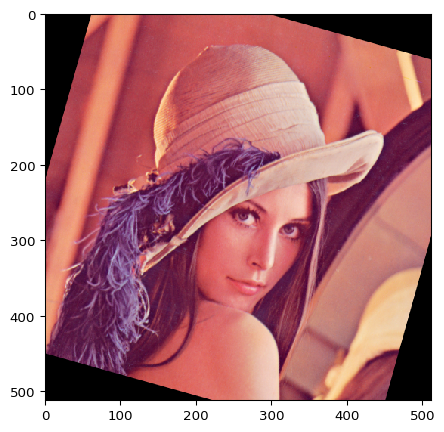

In [98]:
from imgaug import augmenters as iaa
ia.seed(4)

rotate = iaa.Affine(rotate=(-25, 25))
image_aug = rotate.augment_image(image)

print("Augmented:")
ia.imshow(image_aug)

Augmented batch:


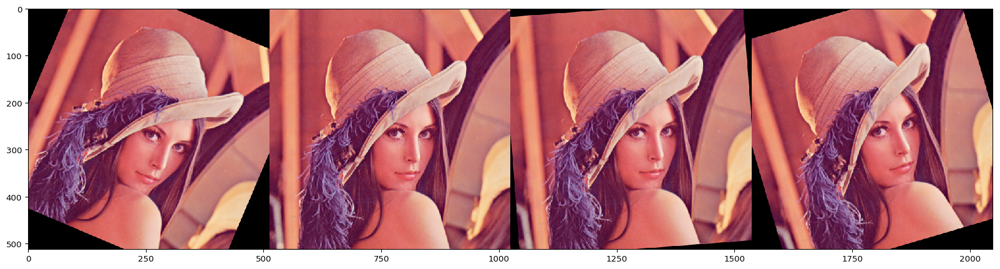

In [99]:
import numpy as np

images = [image, image, image, image]
# images = images * 2
images_aug = rotate.augment_images(images)

print("Augmented batch:")
ia.imshow(np.hstack(images_aug))

# AdditiveGaussianNoise & Crop

- AdditiveGaussianNoise： 加入高斯噪声
- Crop：随机裁剪 

**params**

- scale : 服从正态分布 N(10,100) ??
- percent : 从边缘随机剪切 0% ～ 20% 

Augmented:


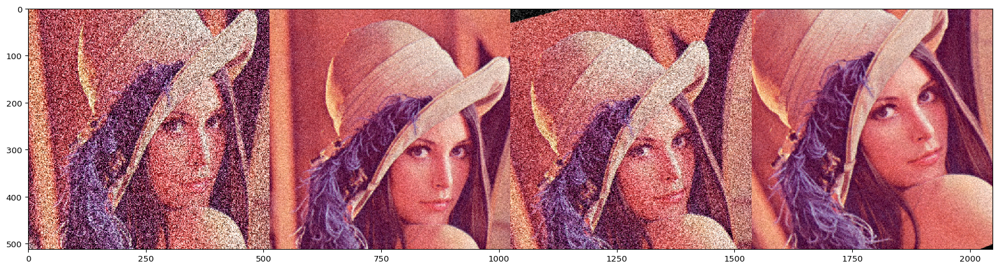

In [110]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(10, 100)),
    iaa.Crop(percent=(0, 0.2))
])

images_aug = seq.augment_images(images)

print("Augmented:")
ia.imshow(np.hstack(images_aug))

Augmented:


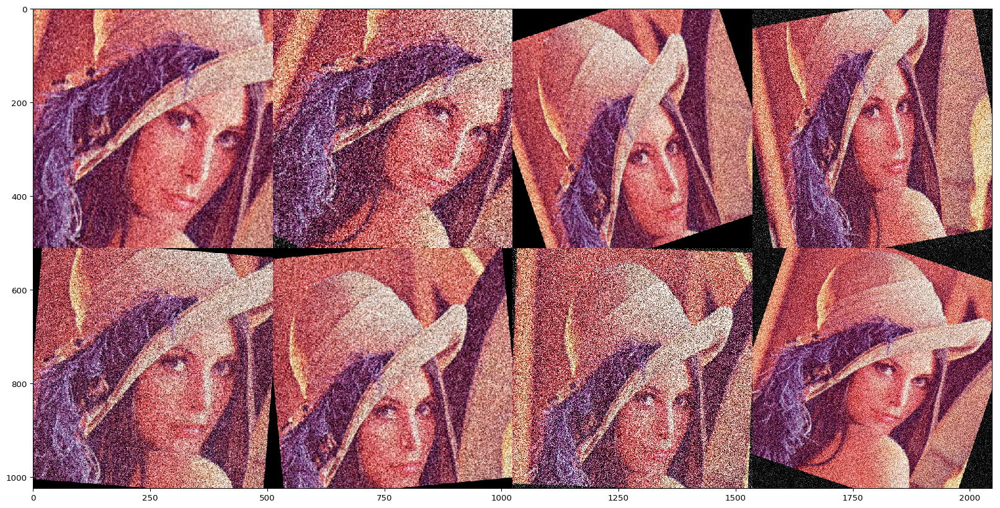

In [137]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(30, 90)),
    iaa.Crop(percent=(0, 0.3))
], random_order=True)

images_aug = [seq.augment_image(image) for _ in range(8)]

print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))

# CropAndPad
- pad_mode :
  - "constant" 
  - "edge"
  - "linear_ramp"
  - "maximum"
  - "mean"
  - "median"
  - "minimum"
  - "reflect"
  - "symmetric"
  - "wrap"
  - ia.ALL

Augmented:


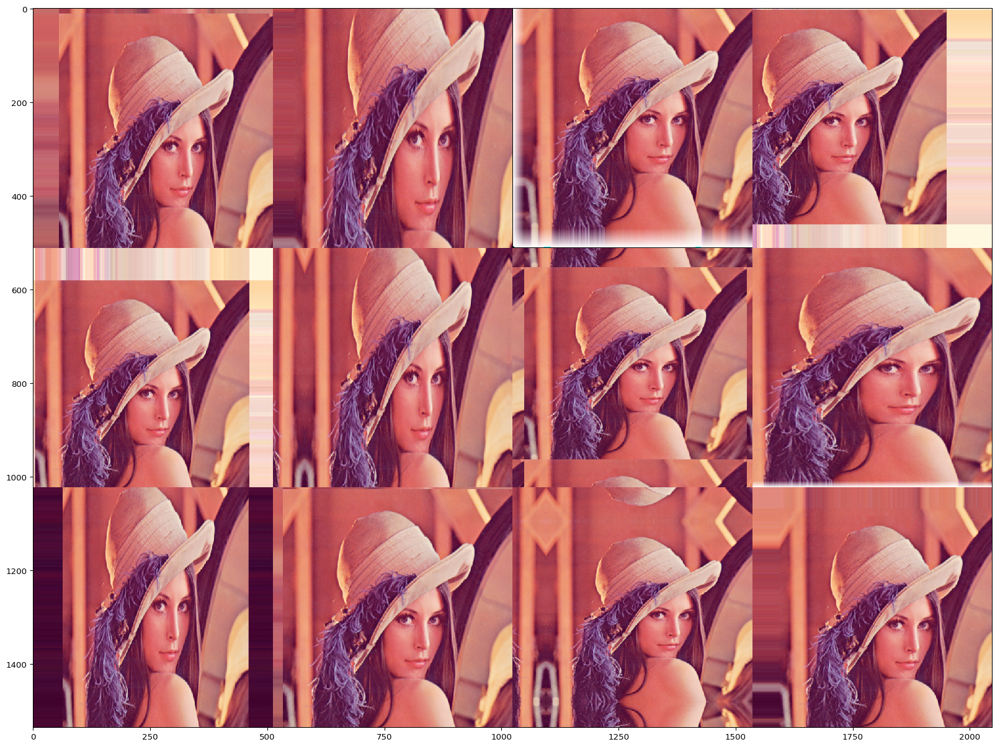

In [140]:
seq = iaa.Sequential([
    iaa.CropAndPad(percent=(-0.2, 0.2), pad_mode=ia.ALL),  # crop and pad images
], random_order=True)

images_aug = [seq.augment_image(image) for _ in range(12)]

print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=3))

# AddToHueAndSaturation & ElasticTransformation & CoarseDropout
- AddToHueAndSaturation 
- ElasticTransformation 
- CoarseDropout


**params**
- alpha
- sigma
- size_percent

Image 0 (input shape: (257, 286, 3), output shape: (257, 286, 3))


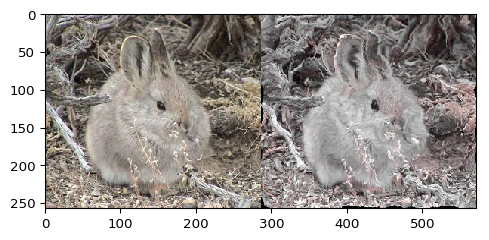

Image 1 (input shape: (536, 800, 3), output shape: (536, 800, 3))


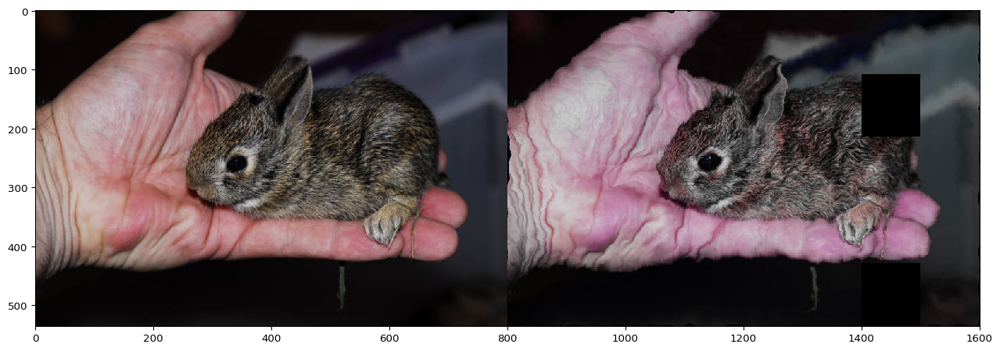

Image 2 (input shape: (289, 520, 3), output shape: (289, 520, 3))


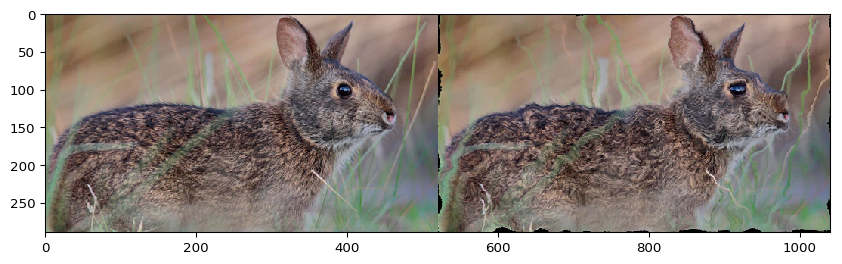

In [142]:
seq = iaa.Sequential([
    iaa.AddToHueAndSaturation((-60, 60)),  # change their color
    iaa.ElasticTransformation(alpha=90, sigma=9),  # water-like effect
    iaa.CoarseDropout((0.01, 0.1), size_percent=0.01)  # set large image areas to zero
], random_order=True)

# load images with different sizes
images_different_sizes = [
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/e/ed/BRACHYLAGUS_IDAHOENSIS.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/c/c9/Southern_swamp_rabbit_baby.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/9/9f/Lower_Keys_marsh_rabbit.jpg")
]

# augment them as one batch
images_aug = seq.augment_images(images_different_sizes)

# visualize the results
print("Image 0 (input shape: %s, output shape: %s)" % (images_different_sizes[0].shape, images_aug[0].shape))
ia.imshow(np.hstack([images_different_sizes[0], images_aug[0]]))

print("Image 1 (input shape: %s, output shape: %s)" % (images_different_sizes[1].shape, images_aug[1].shape))
ia.imshow(np.hstack([images_different_sizes[1], images_aug[1]]))

print("Image 2 (input shape: %s, output shape: %s)" % (images_different_sizes[2].shape, images_aug[2].shape))
ia.imshow(np.hstack([images_different_sizes[2], images_aug[2]]))